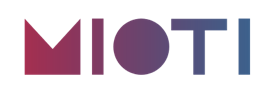
<center style="color:#888">Módulo Data Science in IoT<br/>Asignatura Computer Vision</center>
<center style="color:#aaa; margin-top:10px;">Prof. Diego García Morate<br>diegogm@faculty.mioti.es</center>


# Challenge S4: Reconocimiento de matrículas

## Objetivos

El objetivo de este challenge es implementar una aplicación de video vigilancia capaz de reconocer las matrículas de los vehículos que aparecen en una secuencia de vídeo.

Piensa que las matrículas son un identificador único de los vehículos por lo que ser capaz de reconocerlas es un pilar básico en cualquier aplicación de análisis del tráfico y aplicaciones del ámbito de Smart Cities.

## Configuración del entorno

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data, io, filters, transform
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray
from skimage.measure import label
from skimage.util import invert
from skimage.measure import regionprops
from ipywidgets import interactive, IntSlider, FloatSlider
from ocr import mostrar_blobs, mostrar_rois



import warnings
warnings.filterwarnings("ignore")

Esta vez vamos a cargar unas cuantas funciones auxiliares, las puedes ver en el fichero `ocr.py`.

In [2]:
from ocr import mostrar_blobs, mostrar_rois, mostrar_frames
from ocr import extraer_limites, genera_dataset, carga_dataset, extraer_ventana, dibujar_matches

### Dataset 

En este caso vamos a utilizar algunas imágenes de un dataset de la Universidad de Zagreb (http://www.zemris.fer.hr/projects/LicensePlates/english/results.shtml) las imágenes se encuentran en la carpeta `dataset`.

El primer paso que vamos a hacer es cargarlas:

In [3]:
dataset_rgb = io.ImageCollection('dataset/*.jpg')
print("Cargadas {} instancias.".format(len(dataset_rgb)))

Cargadas 8 instancias.


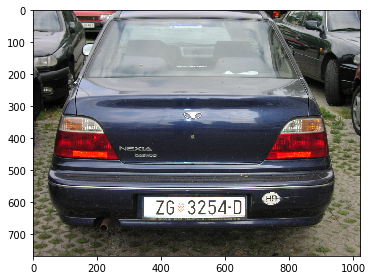

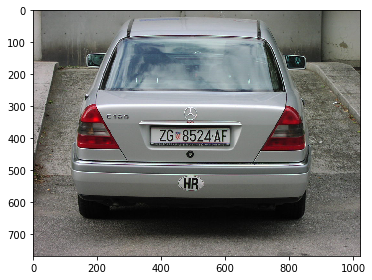

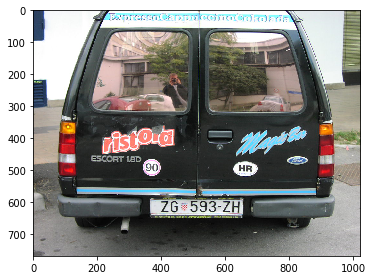

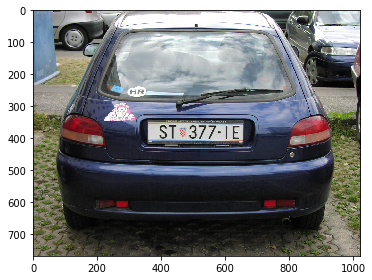

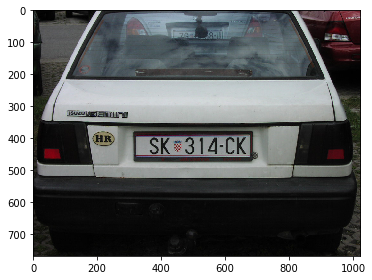

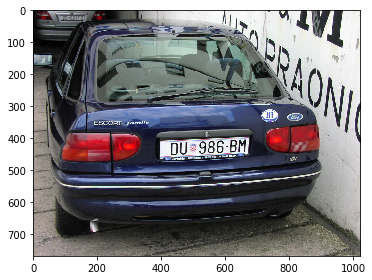

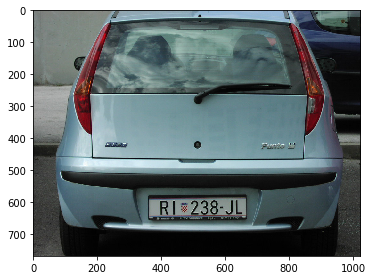

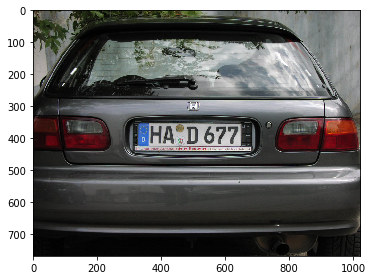

In [4]:
mostrar_frames(dataset_rgb)

### Conversión a gris

El siguiente paso es convertir las imágenes de su espacio de color original RGB en escala de grises:

In [5]:
def convierte_a_gris_frames(imgs):
    """Función que recibe una lista de frames y que devuelve otra lista de frames convertidos en gris."""
    out = []
    for img in imgs:
        try:
            img_gris = rgb2gray(img)
            out.append(img_gris)
        except Exception:
            pass
    
    
    # Recorre cada frame, conviértelo a gris y guardalo en la lista out.

    return out

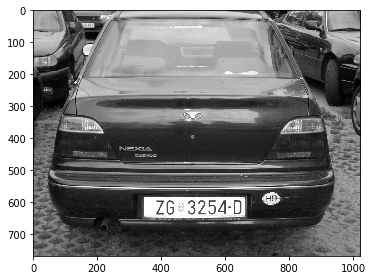

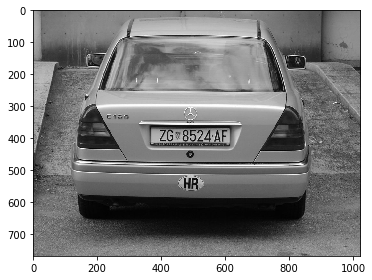

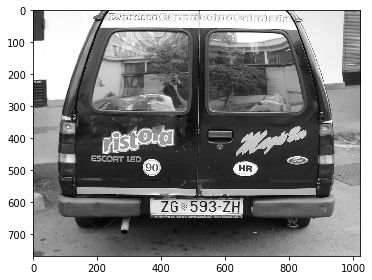

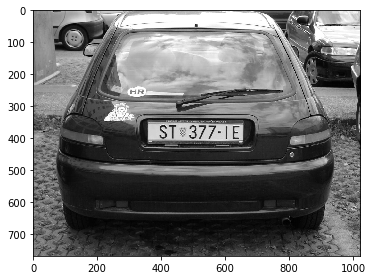

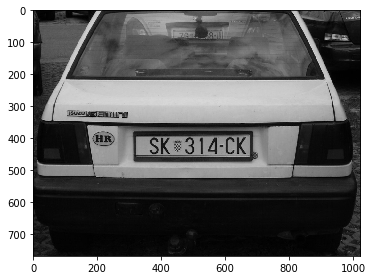

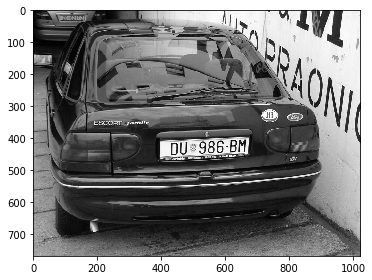

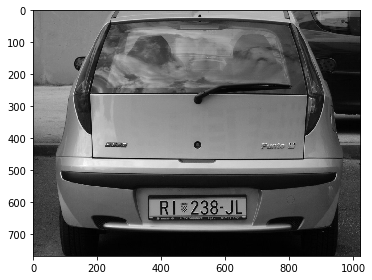

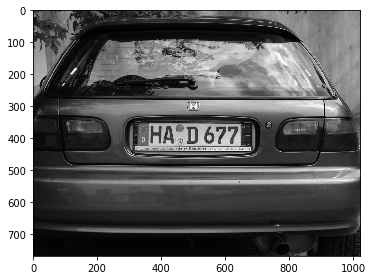

In [6]:
dataset_gris = convierte_a_gris_frames(dataset_rgb)
mostrar_frames(dataset_gris)

### Binarización

Una vez convertidas las imagenes a escala de grises vamos a binarizarlas:

In [7]:
def binariza_frames(imgs):
    """Función que recibe una lista de frames en escala de grises y los convierte a monocromo."""
    out = []
    
    for img in imgs:
        img_gris = rgb2gray(img)
        umbral_otsu = threshold_otsu(img)
        img_mono = img_gris > umbral_otsu
        out.append(img_mono)
    
    # Recorre cada frame y binarizalo. Guárdalo en la lista out.

    return out

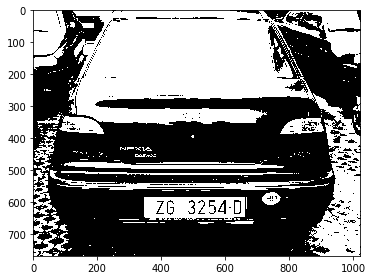

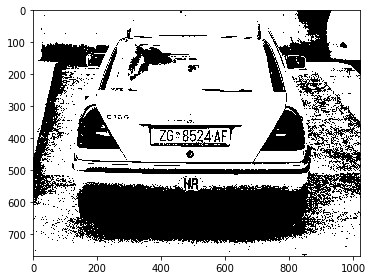

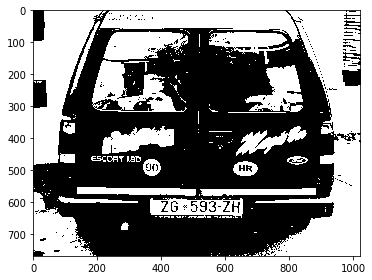

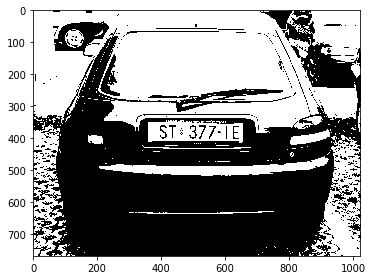

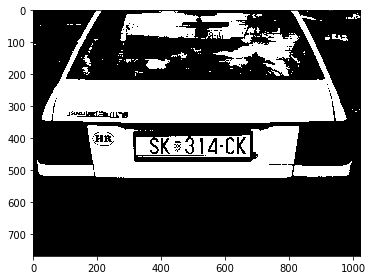

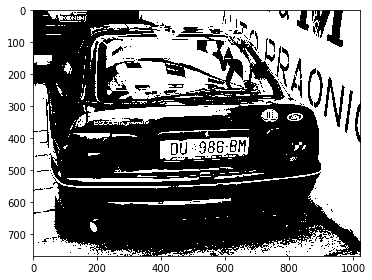

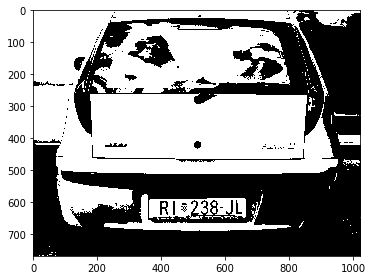

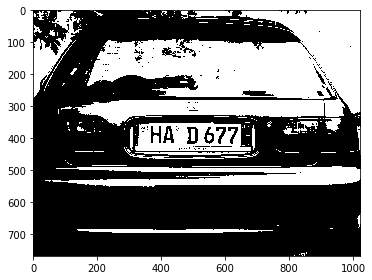

In [8]:
dataset_mono = binariza_frames(dataset_gris)
mostrar_frames(dataset_mono)

### Segmentación

Una vez binarizadas estamos en condiciones de realizar la segmentación (identificación de caracteres):

In [9]:
from skimage.color import label2rgb
def extraccion_de_rois(imgs, debug=False):
    """Recibe una lista de imagenes en monocromo y devuelve una lista de regiones de interes"""
    """adicionalmente si debug es True muestra por cada imagen los rois extraidos"""
    out = []
    for img in imgs:
        img_labeled = label(invert(img))
        #img_labeled_rgb = label2rgb(img_labeled, image=img)
        rois = regionprops(img_labeled)
        out.append(rois)
        mostrar_rois(img, rois)
    # Recorre cada imagen y extrae los rois, si debug=True muestrálos con mostrar_rois
        
    return out

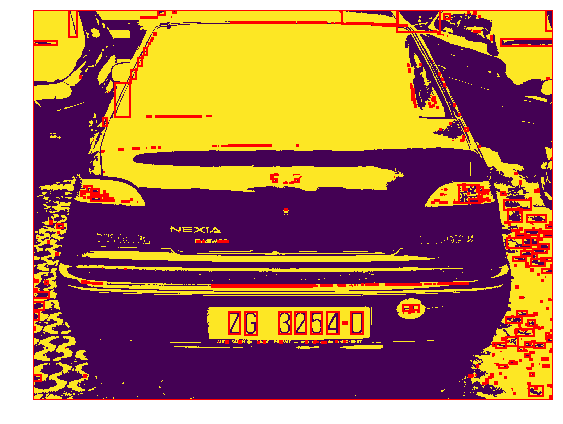

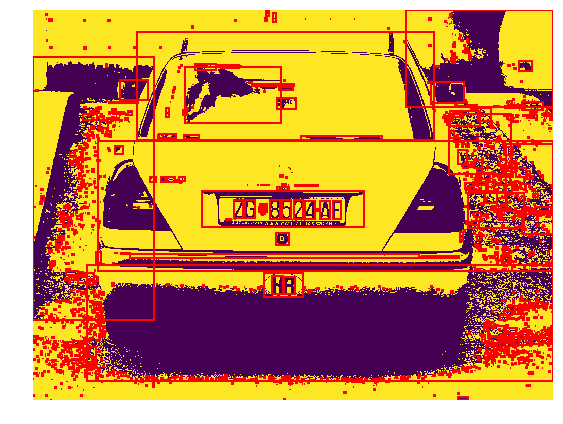

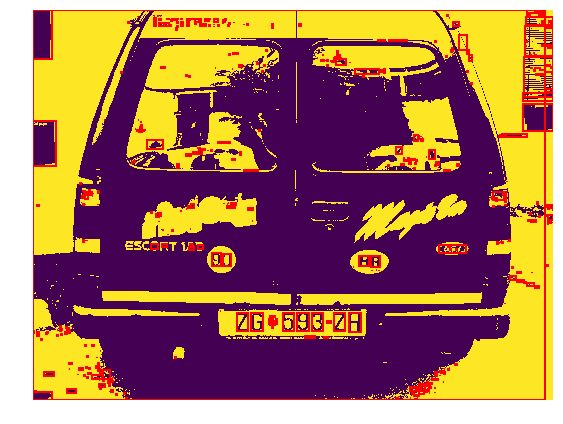

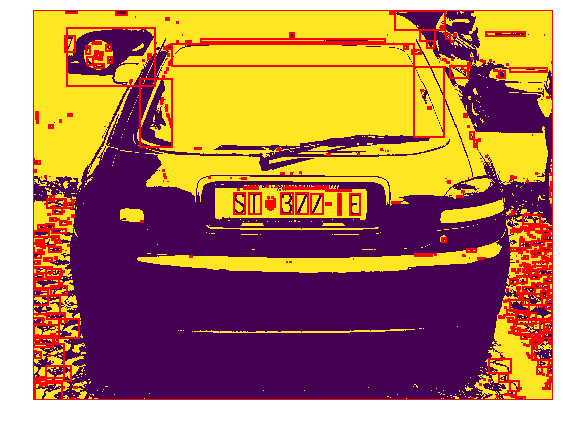

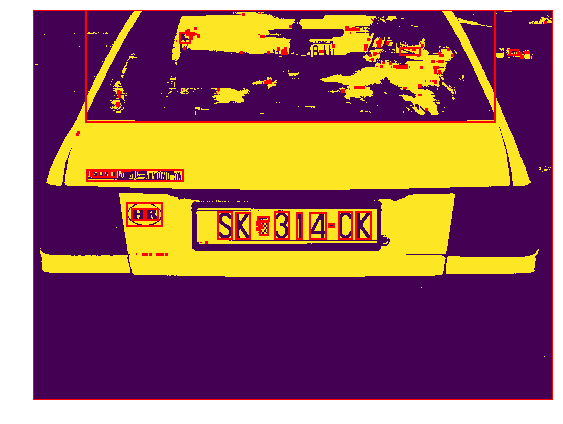

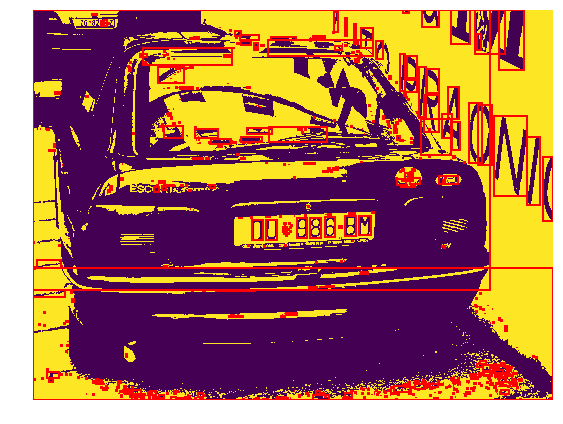

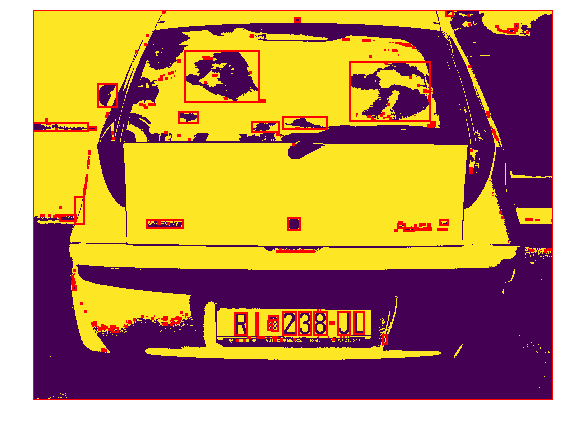

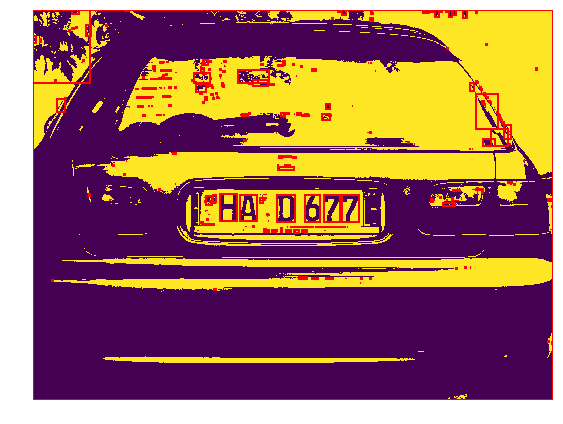

In [10]:
dataset_rois = extraccion_de_rois(dataset_mono, debug=True)

### Filtrado de rois

Como puedes ver en los resultados de los rois hay muchos falsos positivos. Filtra los mismos de manera que minimize los falsos rois manteniendo los verdaderos. 

Apoyate en la función `filtrar_rois` que filtra los rois que estén fuera de un área minima y área máxima.

In [11]:
def filtrar_rois(rois, area_min=200, area_max = 400):
    rois_filtered = []
    for roi in rois:
        if roi.area >= area_min and roi.area <= area_max:
            rois_filtered.append(roi)
            
    return rois_filtered

In [12]:
def limpiar_rois(dataset_rois, imgs, debug=True):
    """Función que recibe una lista con los rois de cada frame junto a una lista de frames"""
    """Si debug es True adicionalmente se muestran los rois sobreimpresos en la imagen usando mostrar_rois"""
    out = []
    
    for roi,frame in zip(dataset_rois, imgs):
        filt =  filtrar_rois(roi, area_min = 150, area_max = 1250)
        out.append(filt)
        if debug == True:
            mostrar_rois(frame, roi)
    # Recorre cada grupo de rois y filtralo. Guardarlo en out y si debug=True muéstralos.
        
    return out

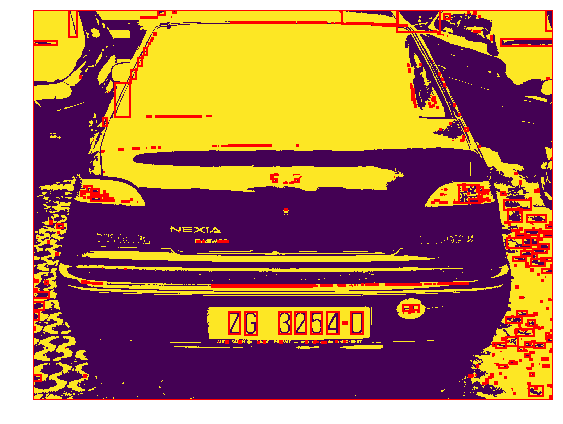

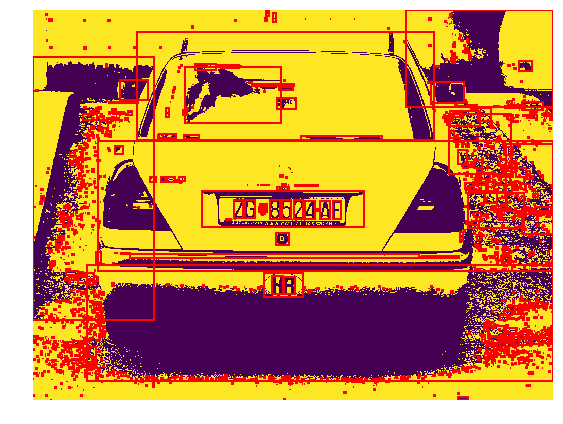

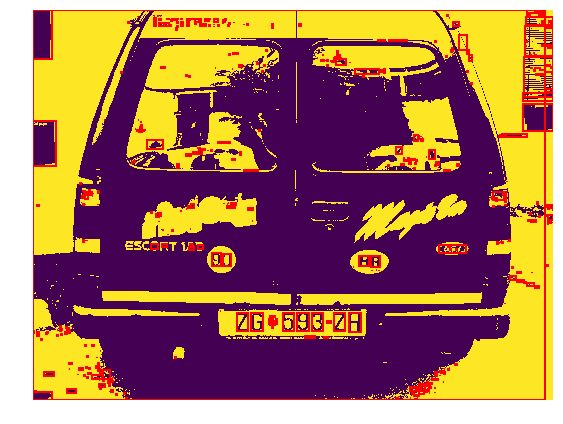

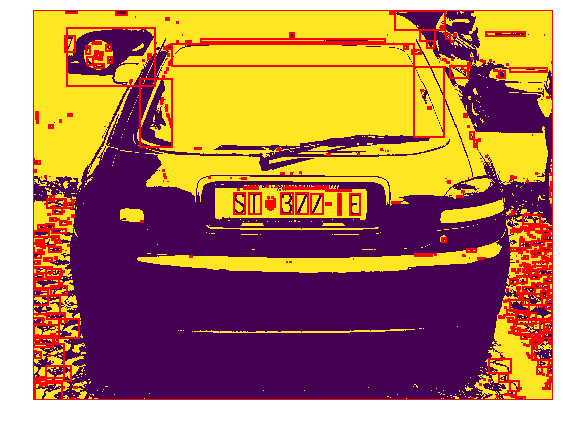

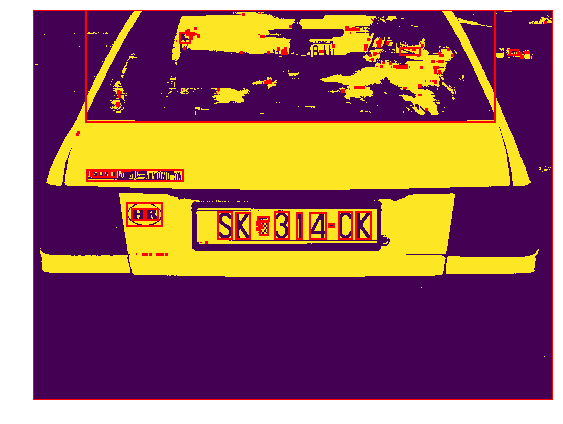

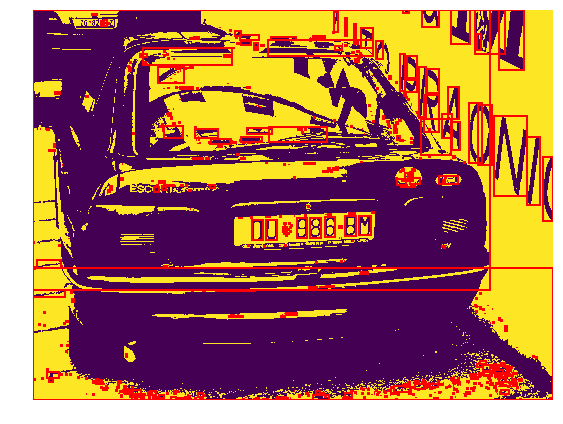

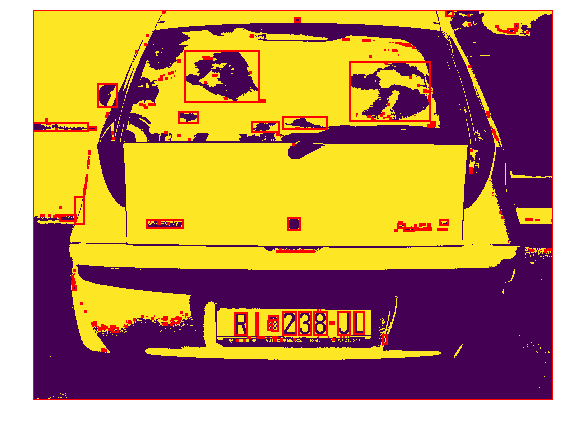

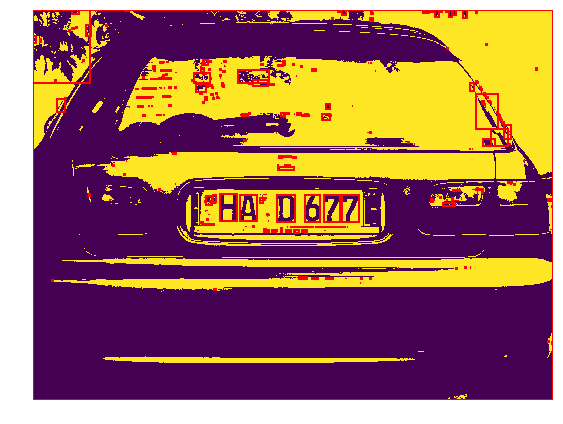

In [13]:
dataset_rois_filtered = limpiar_rois(dataset_rois, dataset_mono, debug=True)

### Entrenamiento del modelo

Una vez segmentada la imagen vamos a clasificar los rois obtenidos para ello vamos a generar un dataset y cargarlo:

In [14]:
genera_dataset("corpus", fonts_folder="fonts") # Puedes ver el código de esta función en ocr.py

In [15]:
X, y, clases = carga_dataset("corpus") # Puedes ver el código de esta función en ocr.py

{54: '0', 55: '1', 56: '2', 57: '3', 58: '4', 59: '5', 60: '6', 61: '7', 62: '8', 63: '9', 27: 'A', 28: 'B', 29: 'C', 30: 'D', 31: 'E', 32: 'F', 33: 'G', 34: 'H', 35: 'I', 36: 'J', 37: 'K', 38: 'L', 39: 'M', 40: 'N', 42: 'O', 43: 'P', 44: 'Q', 45: 'R', 46: 'S', 47: 'T', 48: 'U', 49: 'V', 50: 'W', 51: 'X', 52: 'Y', 53: 'Z', 0: 'a', 1: 'b', 2: 'c', 3: 'd', 4: 'e', 5: 'f', 6: 'g', 7: 'h', 8: 'i', 9: 'j', 10: 'k', 11: 'l', 12: 'm', 13: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 41: 'Ñ', 14: 'ñ'}
Cargadas 4800 instancias con 64 atributos. Clases 64.


Entrena el modelo con el dataset proporcionado y evalúa su score.

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42)

In [17]:
from sklearn.neural_network import MLPClassifier
nn = MLPClassifier(random_state=42)
nn.fit(X_train, y_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=42, shuffle=True,
       solver='adam', tol=0.0001, validation_fraction=0.1, verbose=False,
       warm_start=False)

In [18]:
nn.score(X_test, y_test)

0.9819444444444444

### Evaluación

Por último evalúa los rois obtenidos con el modelo entrenado, apoyate en la función `reconoce_roi` que reconoce un roi concreto:

In [19]:
def reconoce_roi(img, roi, model, clases, debug=False):
    """Reconoce una región de interés, devuelve el indice de clase y la letra real"""
    top, left, bottom, right = roi.bbox

    # def extraer_ventana(img, x, y, width, height):
    ventana = extraer_ventana(img, left, top, right - left, bottom - top)
    
    if debug:
        print("Original:")
        io.imshow(ventana)
        io.show()
    
    ventana_scaled = transform.resize(ventana, (8, 8))
    
    if debug:
        print("Preprocesada:")
        io.imshow(ventana_scaled)
        io.show()
    
    y_predicted_filtered = int(model.predict(ventana_scaled.reshape(1, 64)))
    letra = clases[y_predicted_filtered]
    
    if debug:
        print("Clase predicha: {}\n\n".format(letra))
        
    return letra, y_predicted_filtered

In [20]:
def reconoce_imgs(imgs_gris, imgs_rgb, dataset_rois):
    """Recibe una lista de imágenes en gris, los mismos en rgb y sus correspondientes rois y los clasifica"""
    """y muestra los resultados."""
    
    # Recorre cada imagen y sus rois y reconocelos, metelos en una lista y muestralos con la función
    # dibujar_matches
    for i in range(len(imgs_gris)):
        matches = []
        for roi in dataset_rois[i]:
            letra, class_index = reconoce_roi(imgs_gris[i], roi, nn, clases, False)
            matches.append((roi, letra))
        dibujar_matches(imgs_rgb[i], matches, show_original_img=True)

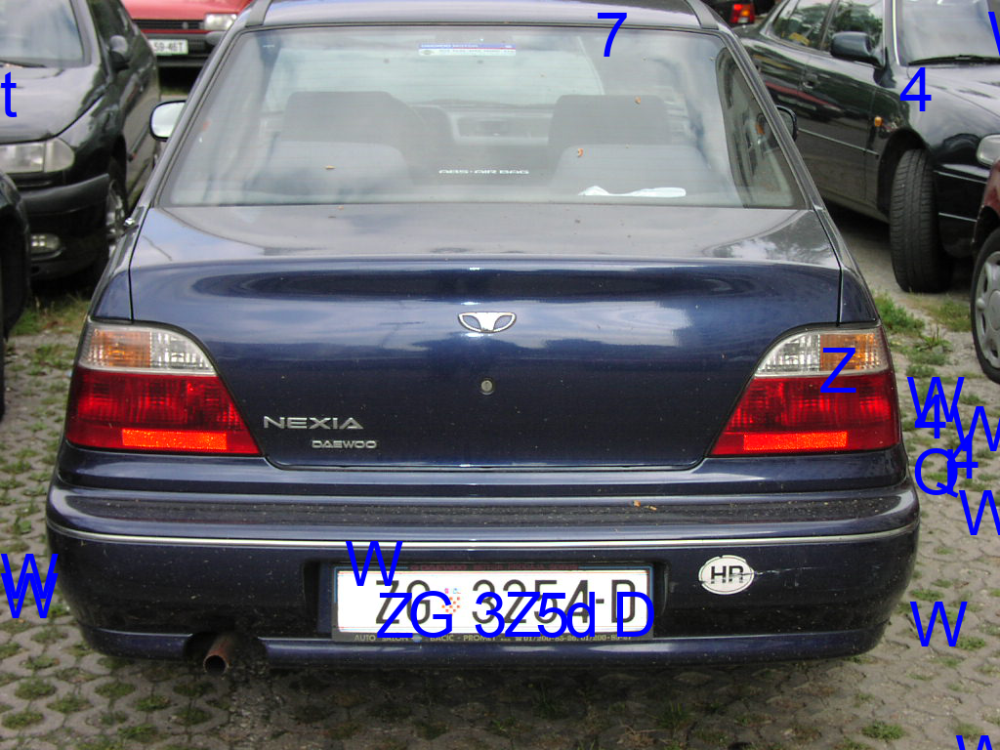

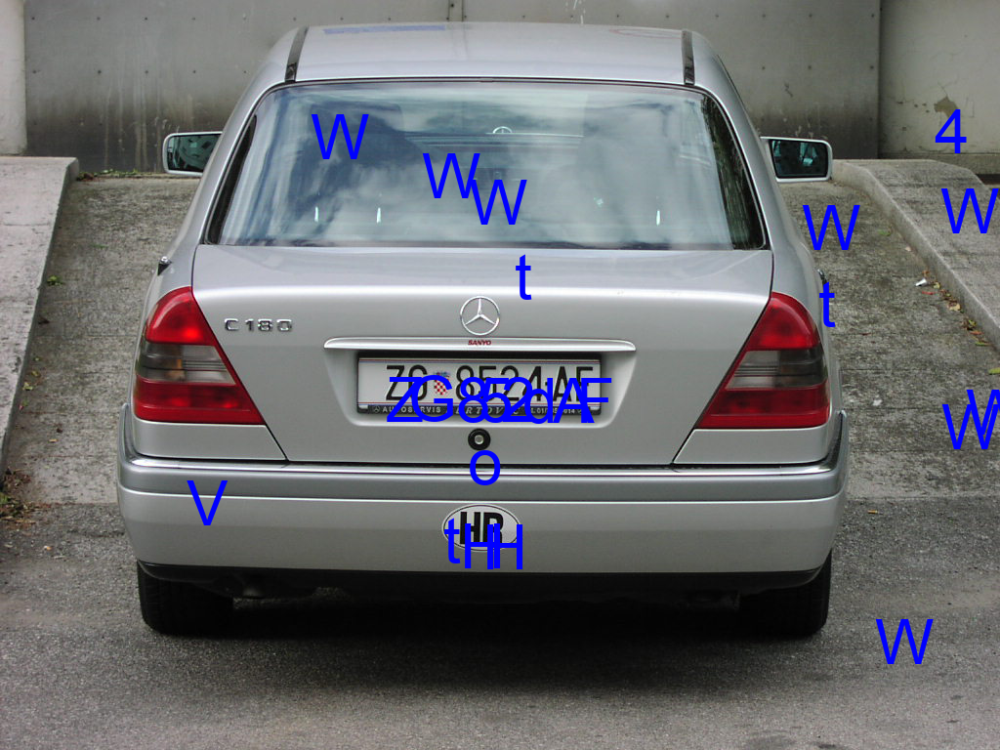

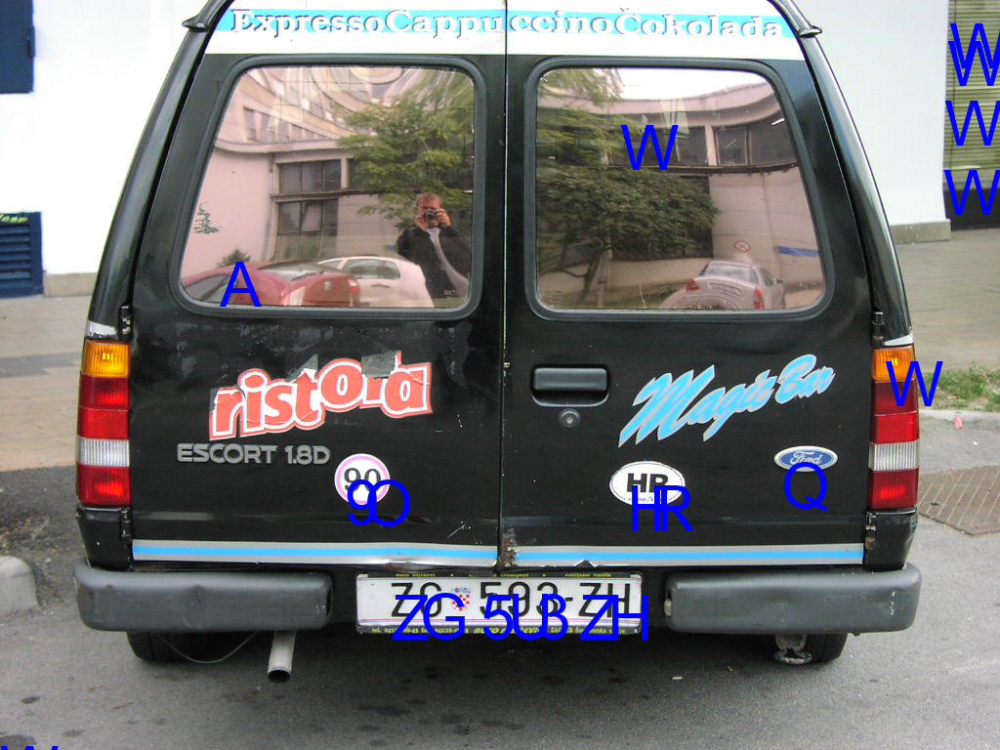

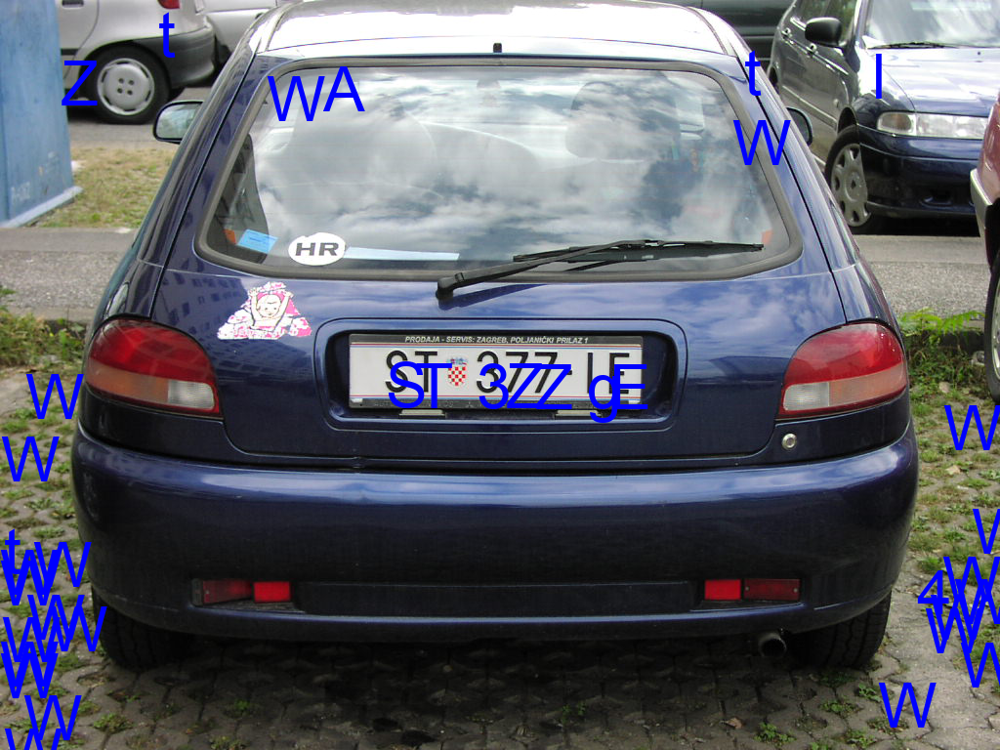

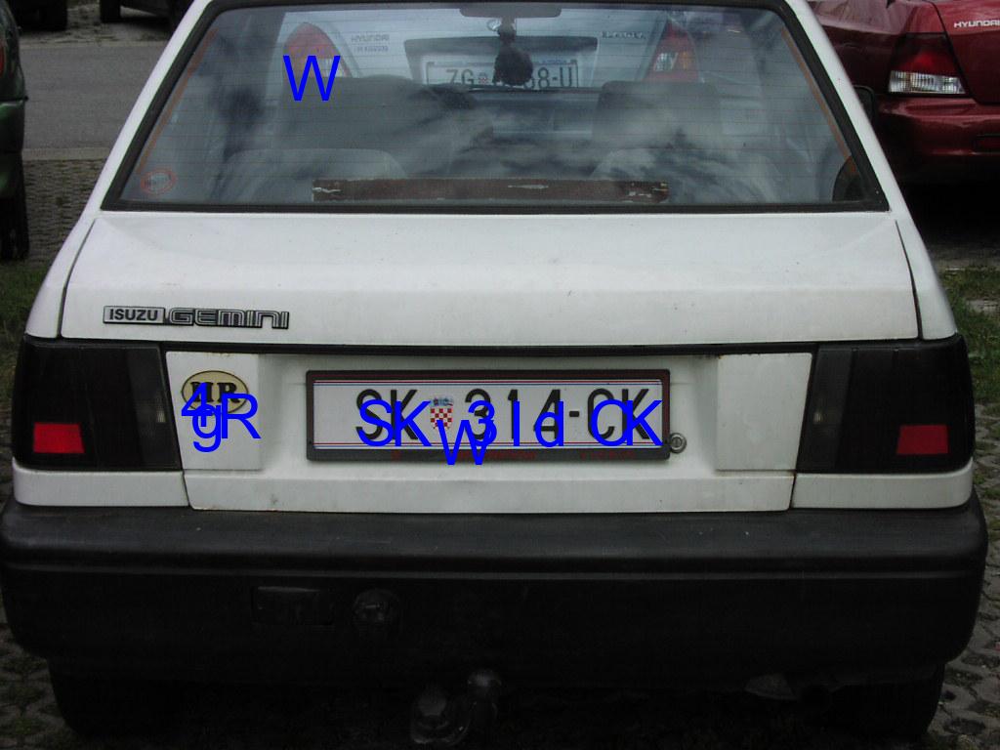

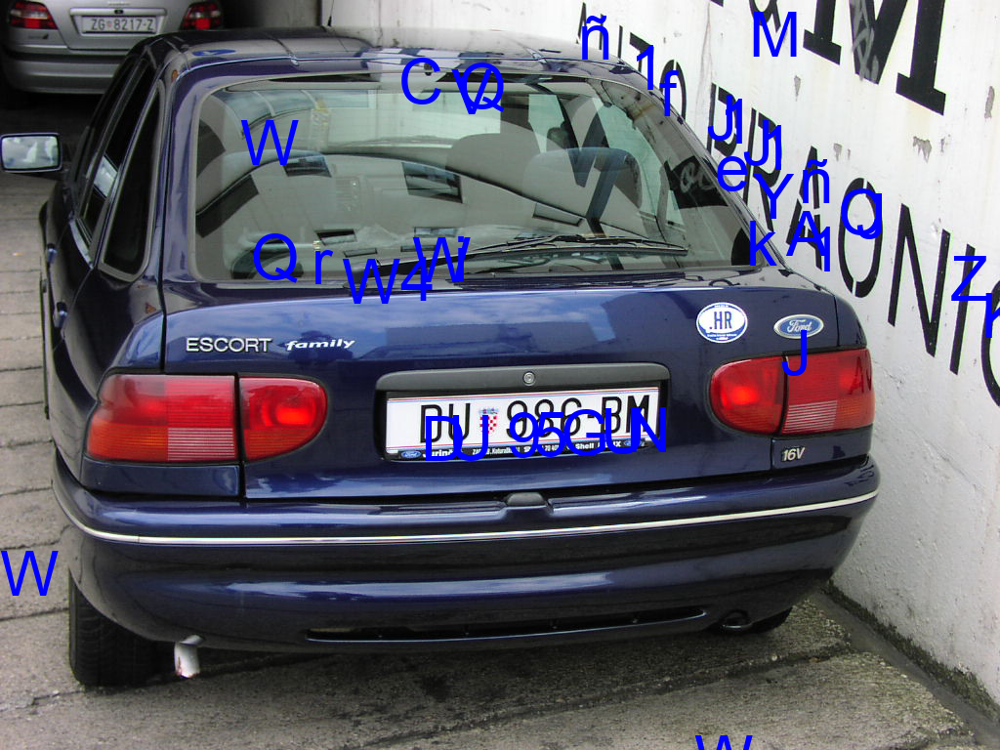

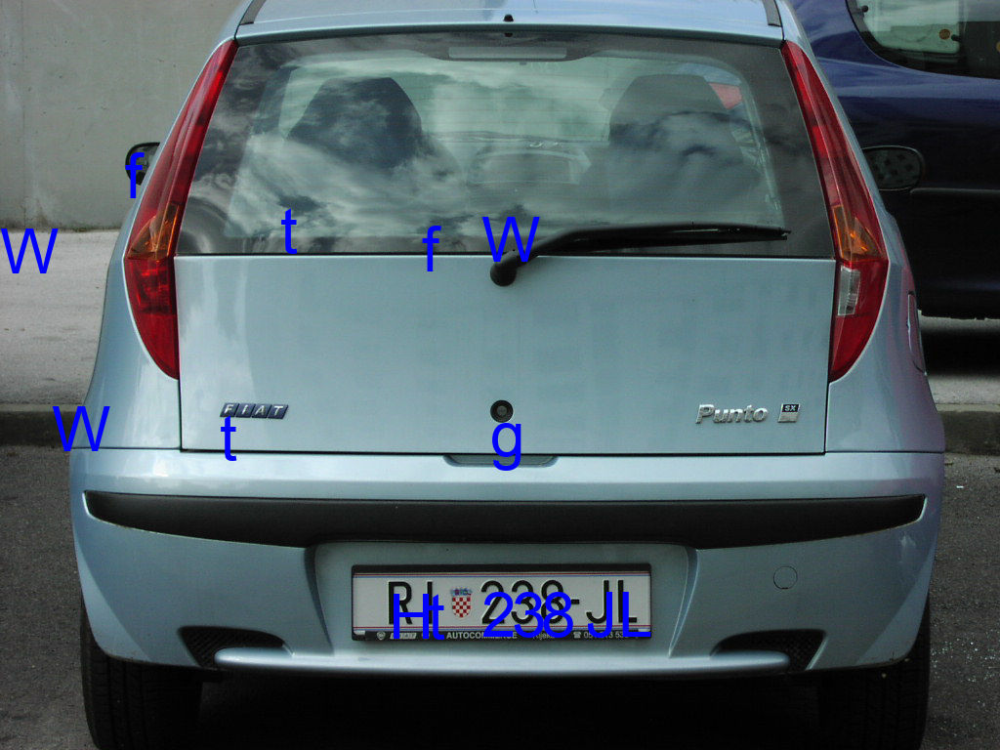

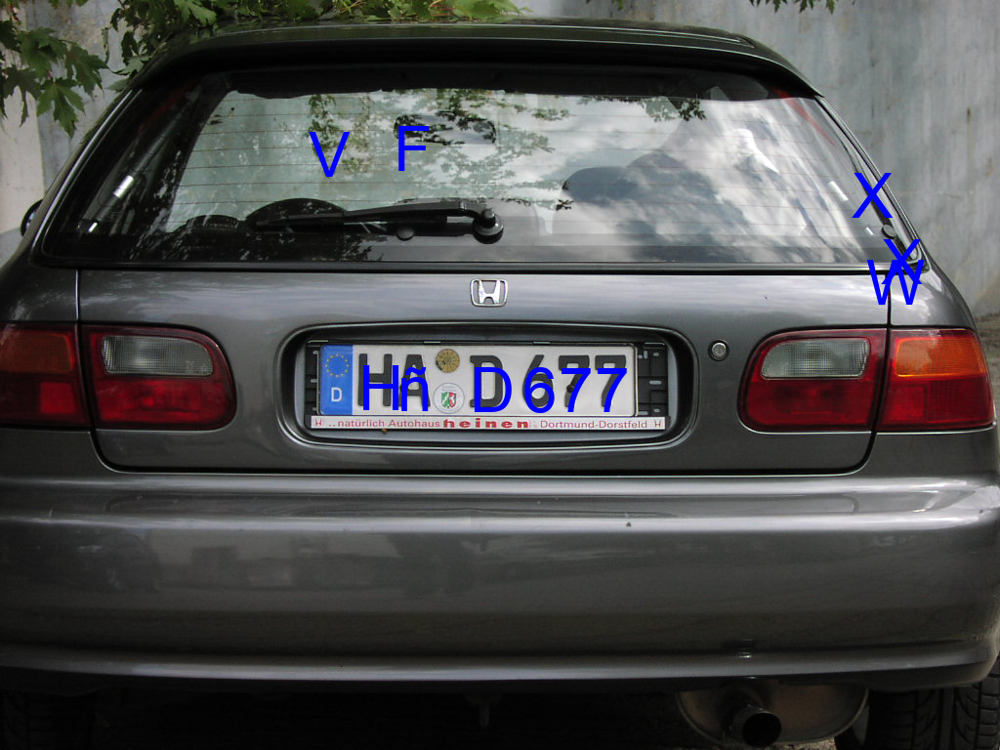

In [21]:
reconoce_imgs(dataset_gris, dataset_rgb, dataset_rois_filtered)

### Conclusiones

* ¿ Cómo mejorarías el algoritmo?

Se podría aplicar alguna función para ecualizar las imagenes y observar el resultado al reconocer las matrículas. Además, se puede variar el tamaño de los datasets y alguntas de sus features para poder evaluar el algoritmo en distintos casos. Finalmente, también será necesario probar con distintos umbrales al evaluar el modelo.